In [1]:
import cv2
from shapely.geometry import Polygon

from PIL import Image
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision import models
from torch import nn

import pandas as pd
from PIL import ImageEnhance

import torch
from torchvision import models
from torch.nn import CrossEntropyLoss
from torch.nn.functional import softmax
from torch.optim import Adam,lr_scheduler
from torch.nn import functional as F
from torchvision import transforms
from torch.utils.data import Dataset
from utils_d import *

import sys

sys.path.append(r'E:\codes\python\area51m\pytorch_deeplab_xception')

from pytorch_deeplab_xception.modeling import deeplab

os.environ['TORCH_HOME'] = r'E:\data\MODELS' #setting the environment variable

device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')

In [2]:
os.chdir(r'E:\UCL\Dissertation\label\input_test')

In [3]:
names = os.listdir(r'E:\UCL\Dissertation\label\input')

In [4]:
image_size = (800,800)
image_size_detail = (200,200)
number_of_class_firstmodel = 8
number_of_class_secondmodel = 2

transform_deeplab = transforms.Compose([transforms.Resize(image_size),
                                transforms.ToTensor(),
                                transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])])

transform_deeplab_detail = transforms.Compose([transforms.Resize(image_size_detail),
                                transforms.ToTensor(),
                                transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])])

dlab2 = deeplab.DeepLab(num_classes=number_of_class_firstmodel,backbone = 'resnet',output_stride = 16).to(device)

dlab2.load_state_dict(torch.load(r'E:\UCL\Dissertation\label\trained_models\model_deeplabv3+resnet_2_900_withoutw_last_op8_.pt'))

_ = dlab2.eval()

for p in dlab2.parameters():
    p.requires_grad = False

dlab2_detail = deeplab.DeepLab(num_classes=number_of_class_secondmodel,backbone = 'resnet',output_stride = 16).to(device)

dlab2_detail.load_state_dict(torch.load(r'E:\UCL\Dissertation\label\trained_models\model_deeplabv3+resnet_amp_last_624.pt'))

for p in dlab2_detail.parameters():
    p.requires_grad = False

_ = dlab2_detail.eval()

In [5]:
os.listdir()

['.DS_Store',
 '1130_2.jpg',
 '20200104_130511.jpg',
 '6.jpg',
 'animage (26).jpg',
 'animage (29).jpg',
 'animage (3).jpg',
 'animage (32).jpg',
 'animage (35).jpg',
 'animage (38).jpg',
 'animage (6).jpg',
 'bothwell-11-07-2019.jpg',
 'bothwell-17-07-2019.jpg',
 'bothwell1-14-8-2019.jpeg',
 'bothwell2-18-07-2019.jpeg',
 'bothwell4-14-8-2019.jpeg',
 'Thumbs.db',
 'WhatsApp Image 2019-08-28 at 15.15.49.jpeg',
 'WhatsApp Image 2019-09-08 at 14.07.58.jpeg',
 'WhatsApp Image 2019-10-05 at 10.44.07.jpeg',
 'WhatsApp Image 2019-10-05 at 15.21.03(1).jpeg',
 'WhatsApp Image 2019-10-23 at 11.41.42.jpeg']

In [6]:
dpi = 256

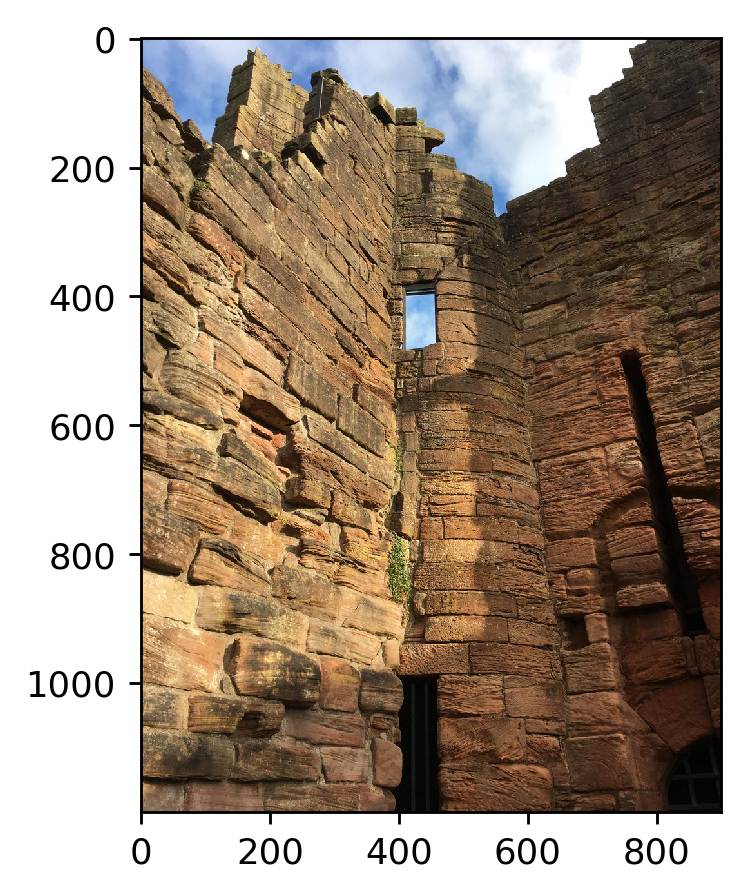

In [7]:
imgname1 = r'animage (6).jpg'
img1 = Image.open(imgname1)#.rotate(-90,expand = True)
plt.figure(dpi = dpi)
plt.imshow(np.array(img1))

In [8]:
distance_list = []
for i in names:
    img2 = Image.open(r'E:\UCL\Dissertation\label\input\{0}'.format(i)).resize(img1.size)
    res = cv2.matchTemplate(np.array(img1),np.array(img2),cv2.TM_CCOEFF_NORMED)
    distance_list.append([i,float(res.squeeze())])
dis_a = np.array(distance_list)

In [9]:
sorted_names = dis_a[dis_a[:,1].argsort()][::-1]
sorted_names[1]

array(['animage (41).jpg', '0.45082834362983704'], dtype='<U50')

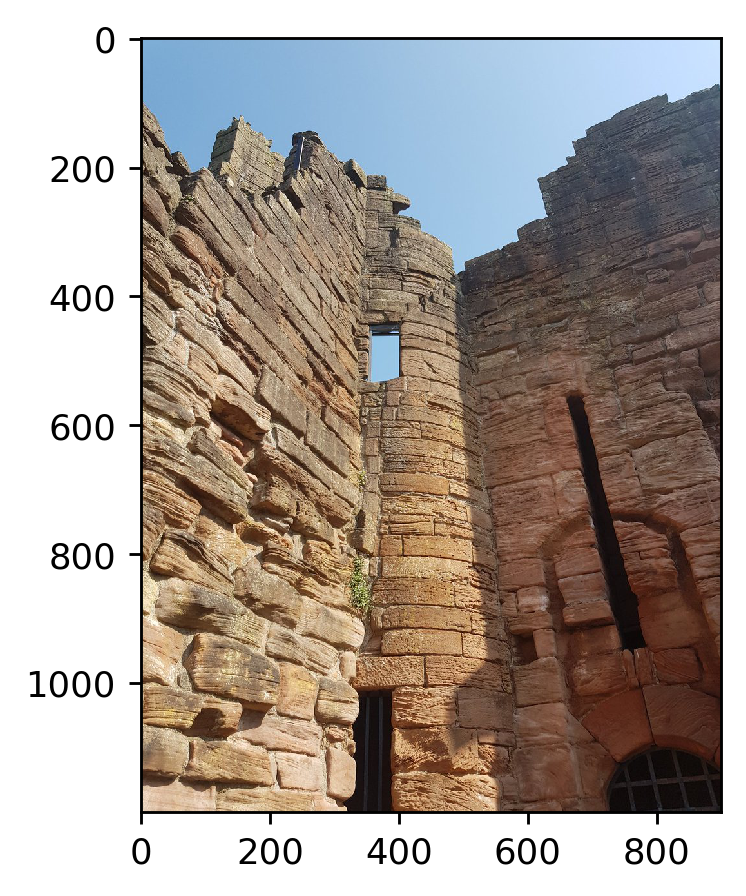

In [10]:
img2 = Image.open(r'E:\UCL\Dissertation\label\input\{0}'.format(sorted_names[1,0])).resize(img1.size)
plt.figure(dpi = dpi)
plt.imshow(np.array(img2.resize(img1.size)))

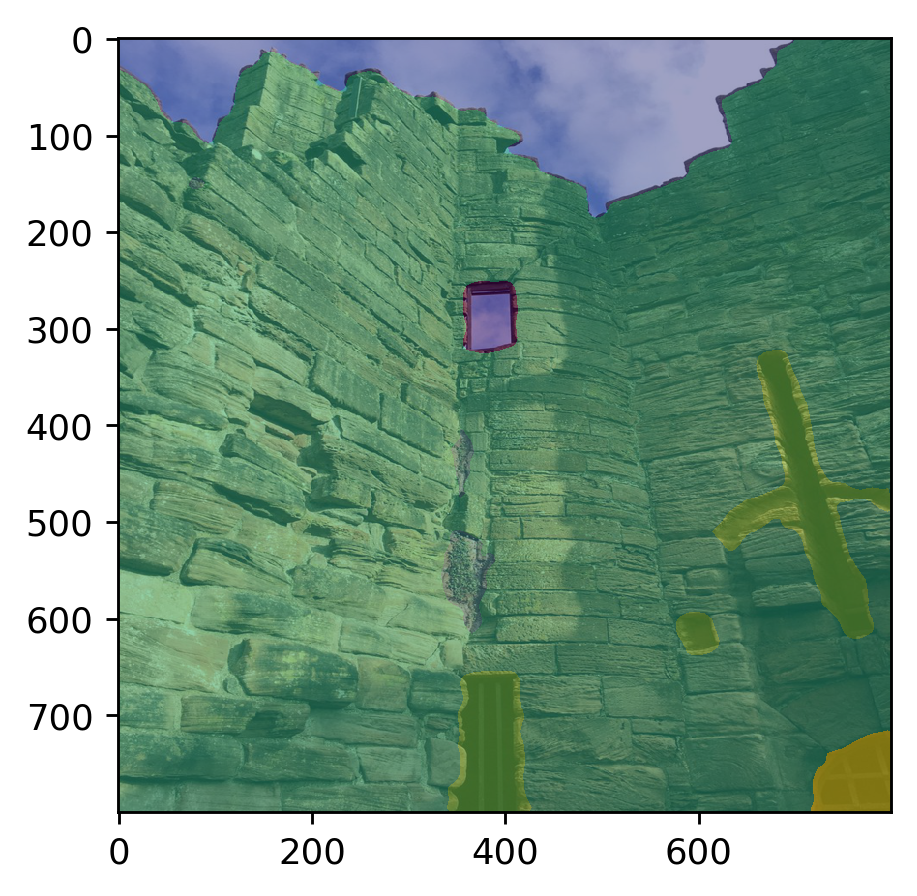

In [11]:
validation = transform_deeplab(img1).unsqueeze(0).to(device)
res= dlab2(validation,interpolate = True).squeeze()

plt.figure(dpi = dpi)
plt.imshow(np.array(img1.resize(image_size)))
plt.imshow(torch.argmax(res,axis = 0).detach().cpu().numpy(),alpha = 0.5)

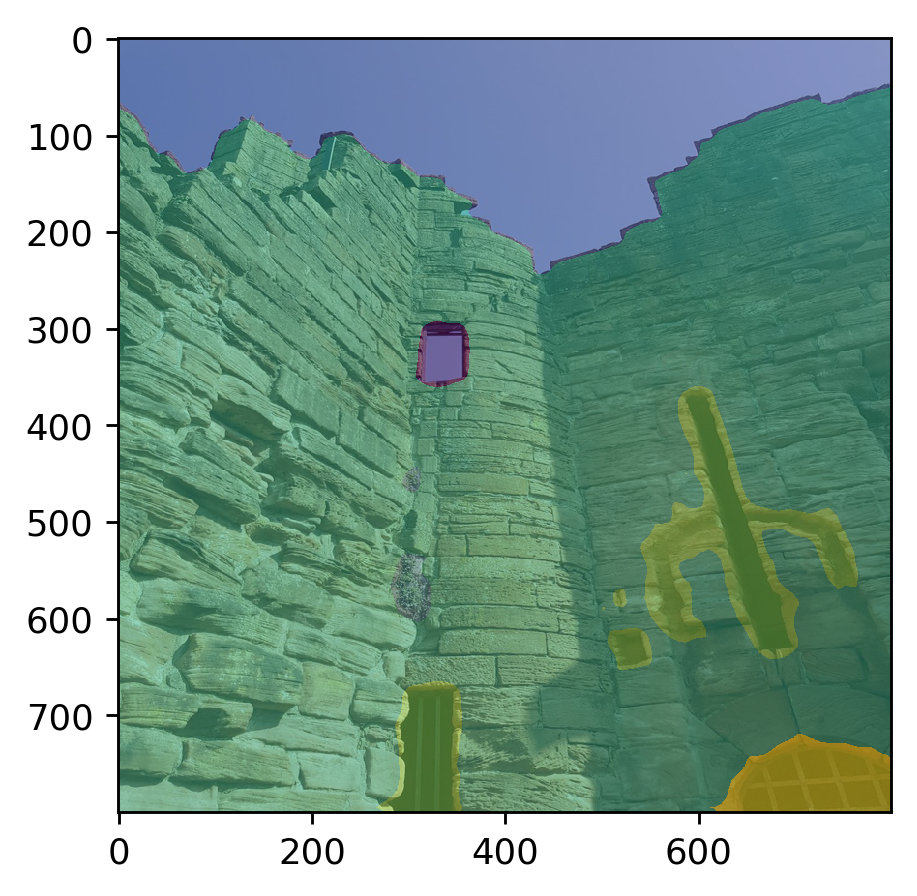

In [12]:
validation = transform_deeplab(img2).unsqueeze(0).to(device)
res= dlab2(validation,interpolate = True).squeeze()

plt.figure(dpi = dpi)
plt.imshow(np.array(img2.resize(image_size)))
plt.imshow(torch.argmax(res,axis = 0).detach().cpu().numpy(),alpha = 0.5)

In [13]:
predicted_image1 = predict(img1,transform_deeplab,transform_deeplab_detail,dlab2,dlab2_detail,3,img1.size,scale = 0.05)
predicted_image2 = predict(img2,transform_deeplab,transform_deeplab_detail,dlab2,dlab2_detail,3,img1.size,scale = 0.05)

In [14]:
img,area_list,polygon_list,coordinates = find_window(img1,dlab = dlab2,transform_deeplab = transform_deeplab,device = device,area_thres = [0.45,0.55],decay = 0.01)
img_,area_list_,polygon_list_,coordinates_ = find_window(img2,dlab = dlab2,transform_deeplab = transform_deeplab,device = device,area_thres = [0.45,0.55],decay = 0.01)

In [15]:
from shapely.affinity import scale
from shapely import affinity
def adjust_polygon(polygon):
    rotated = affinity.rotate(polygon,180,'centroid')
    flipped = scale(rotated, xfact = -1, origin = (1, 0))
    return flipped


(-0.5, 152.5, 203.5, -0.5)

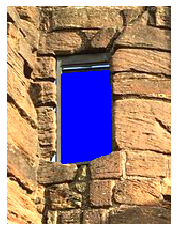

In [16]:
plt.imshow(img);plt.axis('off')

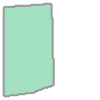

In [17]:
adjust_polygon(polygon_list[0])

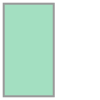

In [18]:
adjust_polygon(polygon_list[0]).minimum_rotated_rectangle

(-0.5, 143.5, 209.5, -0.5)

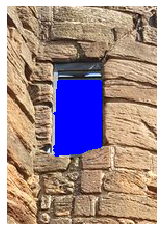

In [19]:
plt.imshow(img_);plt.axis('off')

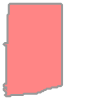

In [20]:
adjust_polygon(polygon_list_[0])

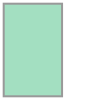

In [21]:
adjust_polygon(polygon_list_[0]).minimum_rotated_rectangle

In [22]:
try:
    label1 = Image.open(r'E:\UCL\Dissertation\label\download_test\{0}'.format(imgname1.split('.')[0]+'_plants.png'))#.rotate(-90,expand = True)
except:
    label1 = Image.fromarray(np.zeros((img1.size[0],img1.size[1],3)).astype(np.uint8))
try:
    label2 = Image.open(r'E:\UCL\Dissertation\label\download\{0}'.format('.'.join(sorted_names[1,0].split('.')[:-1])+'_plants.png')).resize(img1.size)
except:
    label2 = Image.fromarray(np.zeros((img2.size[0],img2.size[1],3)).astype(np.uint8))

(-0.5, 899.5, 1199.5, -0.5)

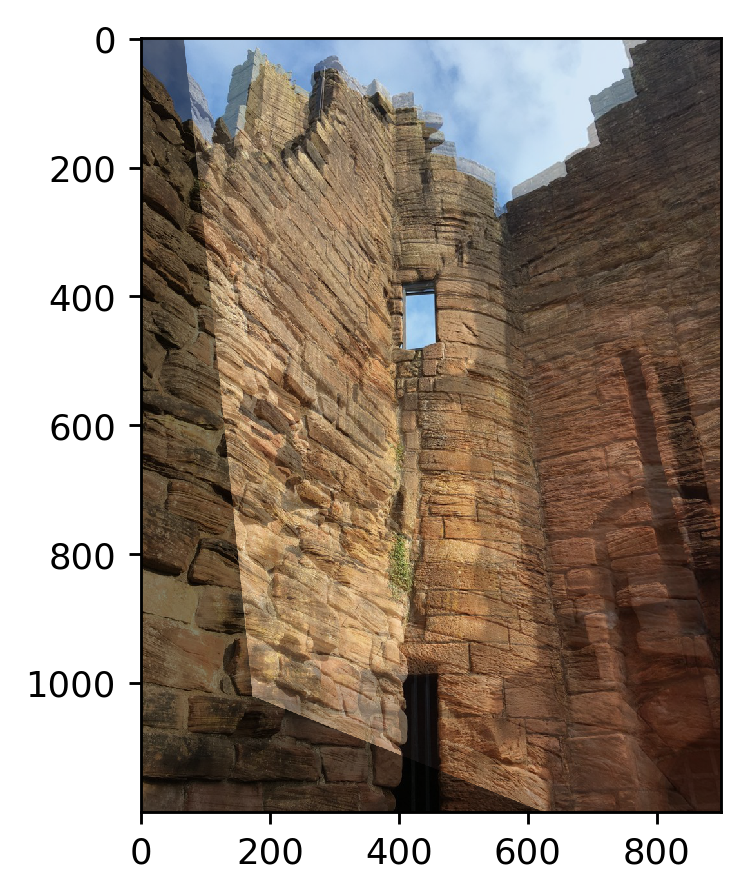

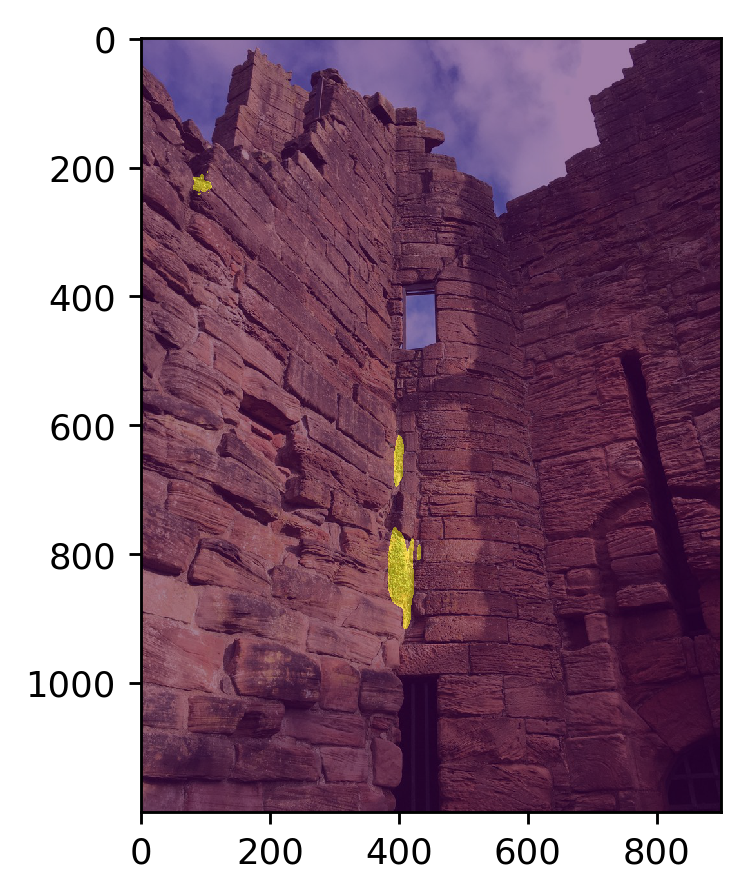

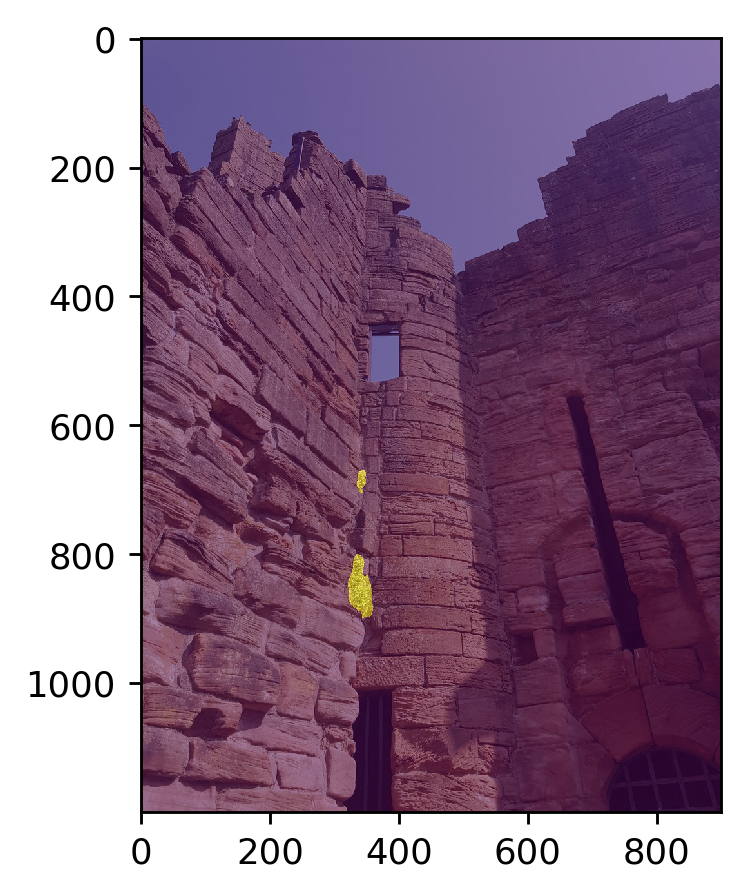

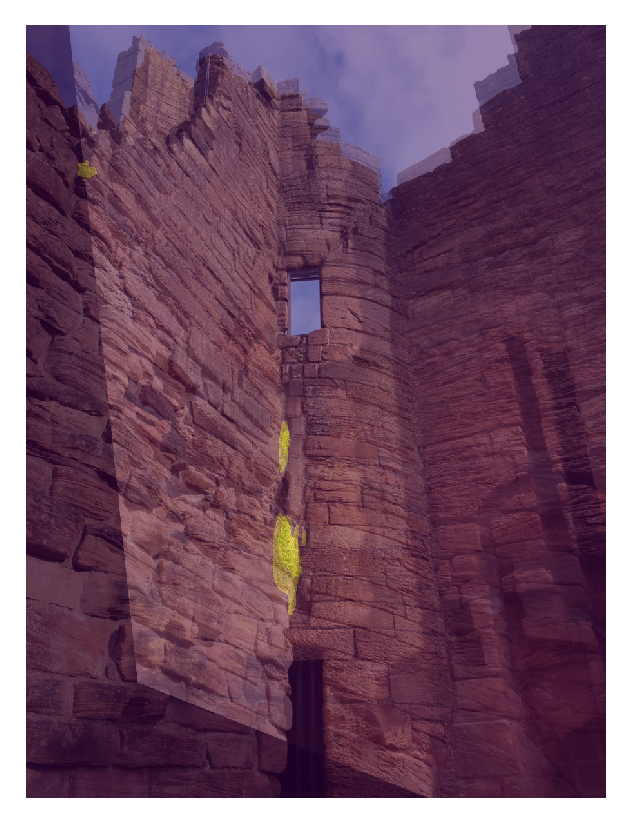

In [23]:
h, mask = cv2.findHomography(adjust_position(outter(polygon_list_[0],out = True),coordinates_[0][0],coordinates_[0][1]),
                             adjust_position(outter(polygon_list[0],out = True),coordinates[0][0],coordinates[0][1]))

warped_original = cv2.warpPerspective(np.array(img2), h, img2.size)
warped_prediction = cv2.warpPerspective(predicted_image2, h, Image.fromarray(predicted_image2).size)

plt.figure(dpi =dpi)
plt.imshow(np.array(img1))
plt.imshow(warped_original,alpha = 0.5)

plt.figure(dpi =dpi)
plt.imshow(np.array(img1))
plt.imshow(predicted_image1,alpha = 0.5)

plt.figure(dpi =dpi)
plt.imshow(np.array(img2))
plt.imshow(predicted_image2,alpha = 0.5)


plt.figure(dpi =dpi)
plt.imshow(warped_original,alpha = 1)

plt.imshow(np.array(img1),alpha = 0.5)

plt.imshow(warped_prediction,alpha = 0.25)
plt.imshow(predicted_image1,alpha = 0.25)
plt.axis('off')

(-0.5, 899.5, 1199.5, -0.5)

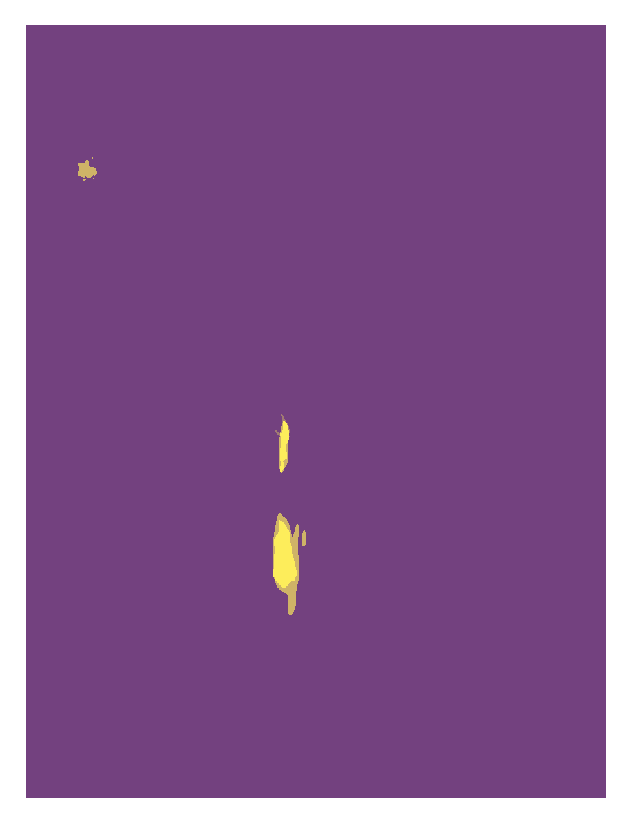

In [24]:
plt.figure(dpi = dpi)
plt.imshow(np.array(label1).sum(axis = 2),alpha = 0.5)
plt.imshow(predicted_image1,alpha = 0.5)
plt.axis('off')

In [25]:
IoU(torch.tensor(np.logical_not(np.array(label1).sum(axis = 2)==0).astype(float)),
    torch.tensor(predicted_image1.astype(float)),2)

0 0.9972705507376664
1 0.5232765612327656


0.760273555985216

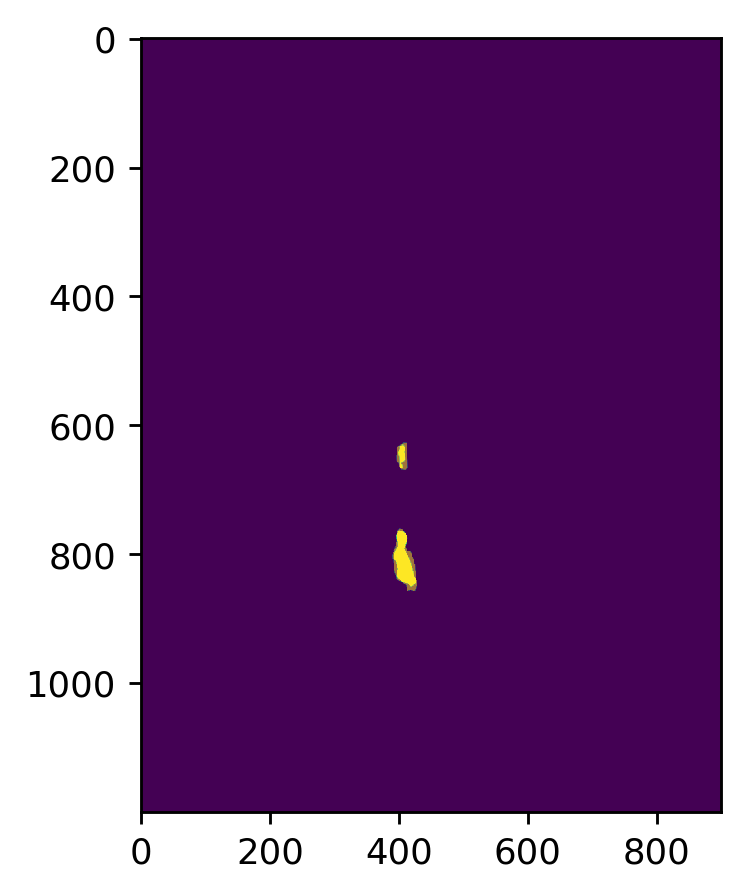

In [26]:
warped_label = cv2.warpPerspective(np.array(label2), h, label2.size)

plt.figure(dpi =dpi)
plt.imshow(warped_prediction,alpha = 1)
plt.imshow(warped_label.sum(axis = 2),alpha = 0.5)

(-0.5, 899.5, 1199.5, -0.5)

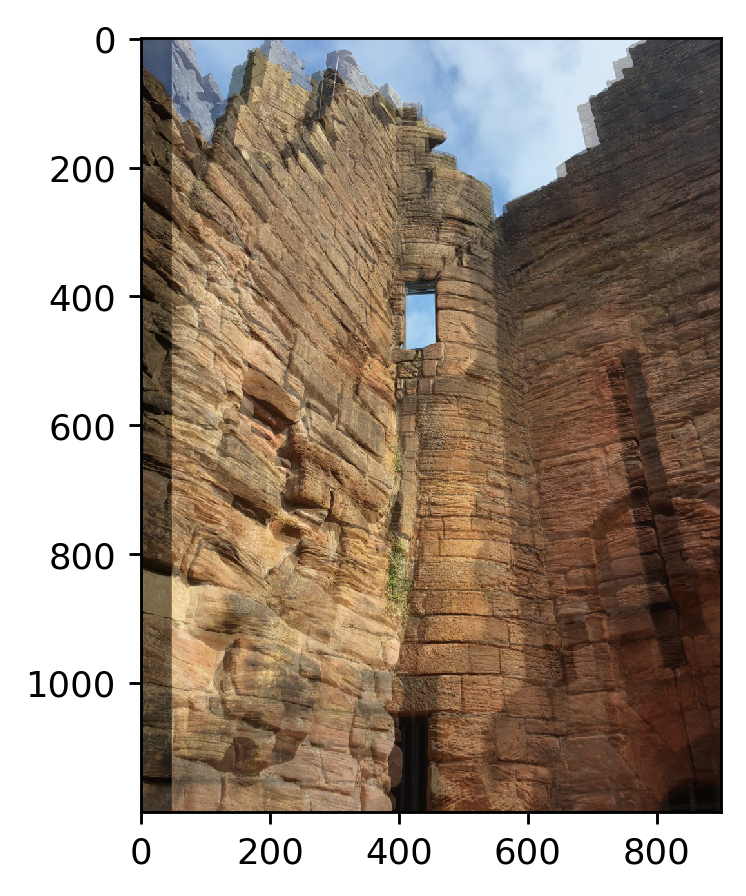

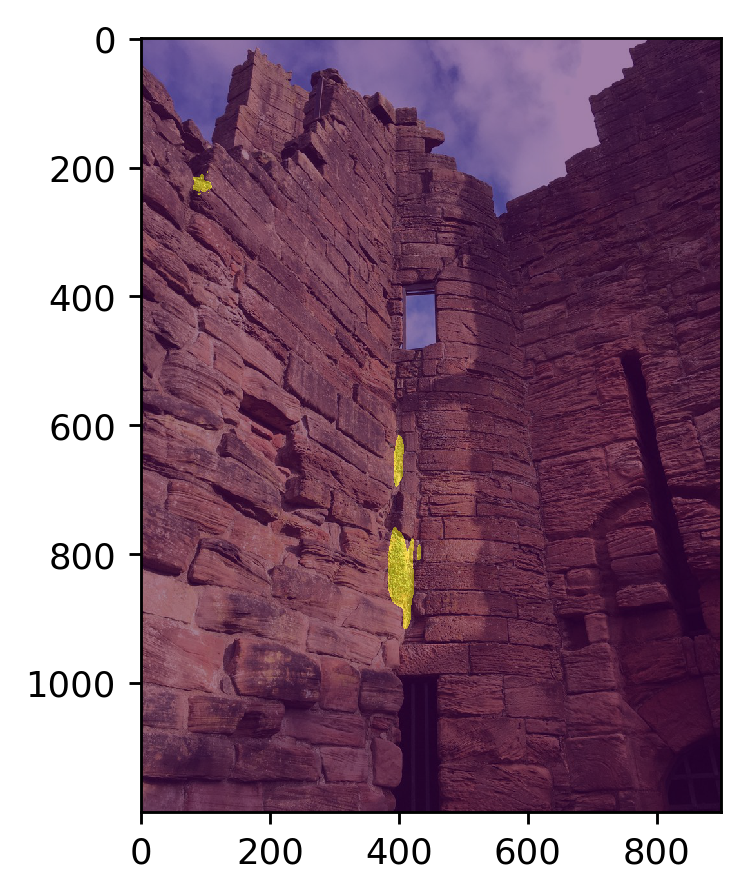

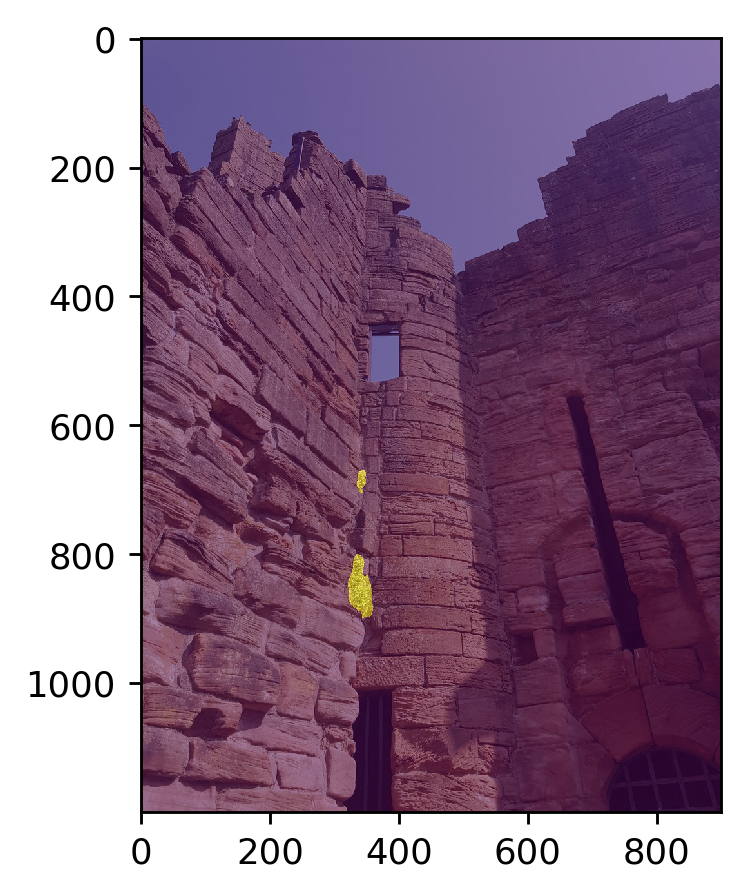

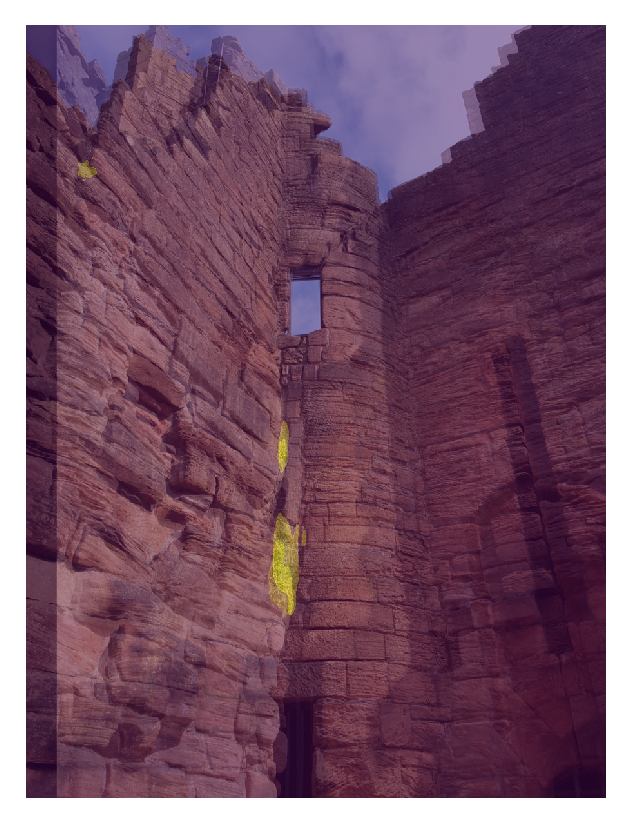

In [27]:
h, mask = cv2.findHomography(adjust_position(outter(polygon_list_[0],out = False),coordinates_[0][0],coordinates_[0][1]),
                             adjust_position(outter(polygon_list[0],out = False),coordinates[0][0],coordinates[0][1]))

warped_original = cv2.warpPerspective(np.array(img2), h, img2.size)
warped_prediction = cv2.warpPerspective(predicted_image2, h, Image.fromarray(predicted_image2).size)

plt.figure(dpi =dpi)
plt.imshow(np.array(img1))
plt.imshow(warped_original,alpha = 0.5)

plt.figure(dpi =dpi)
plt.imshow(np.array(img1))
plt.imshow(predicted_image1,alpha = 0.5)

plt.figure(dpi =dpi)
plt.imshow(np.array(img2))
plt.imshow(predicted_image2,alpha = 0.5)

plt.figure(dpi =dpi)
plt.imshow(warped_original,alpha = 1)

plt.imshow(np.array(img1),alpha = 0.5)

plt.imshow(warped_prediction,alpha = 0.25)
plt.imshow(predicted_image1,alpha = 0.25)
plt.axis('off')

(-0.5, 899.5, 1199.5, -0.5)

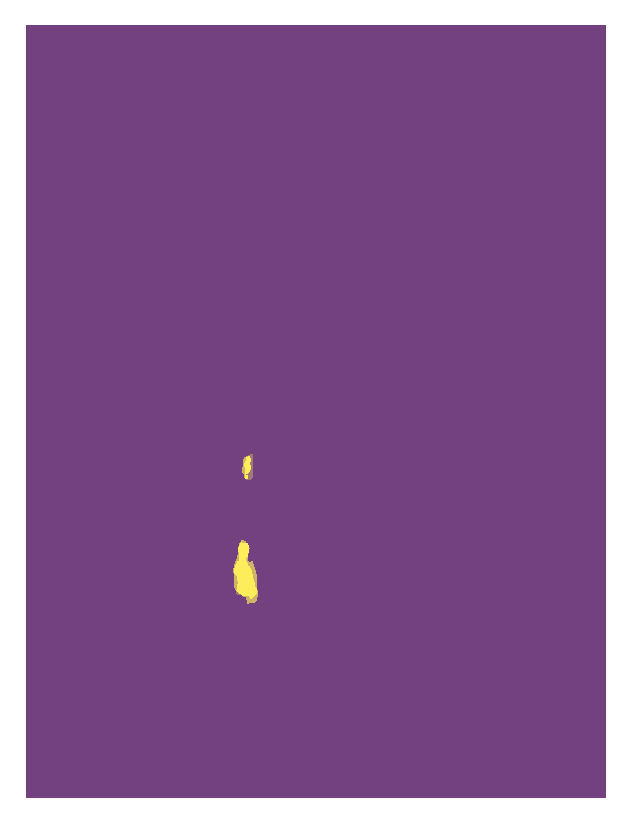

In [28]:
plt.figure(dpi = dpi)
plt.imshow(np.array(label2).sum(axis = 2),alpha = 0.5)
plt.imshow(predicted_image2,alpha = 0.5)
plt.axis('off')

In [29]:
IoU(torch.tensor(np.logical_not(np.array(label2).sum(axis = 2)==0).astype(float)),
    torch.tensor(predicted_image2.astype(float)),2)

0 0.9990426129985694
1 0.6668818592640413


0.8329622361313054

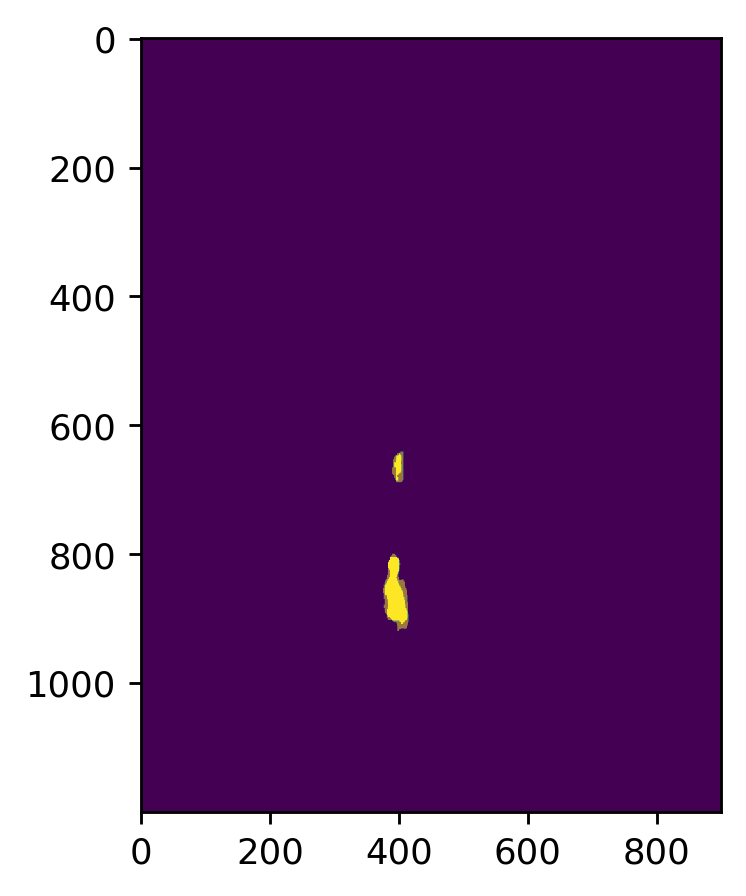

In [30]:
warped_label = cv2.warpPerspective(np.array(label2), h, label2.size)

plt.figure(dpi =dpi)
plt.imshow(warped_prediction,alpha = 1)
plt.imshow(warped_label.sum(axis = 2),alpha = 0.5)